# Carregando os pacotes

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import scanpy.external as sce
import seaborn as sns
import anndata as ad
import squidpy as sq
import scvi
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz
import warnings
warnings.filterwarnings("ignore")
from sccoda.util import comp_ana as mod
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import os
import anndata
import hotspot
import tangram as tg

Global seed set to 0


In [2]:
# Importando o dataset do Peng

adata = sc.read("D:Scanpy/peng_pdac_besca2.raw.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 57530 × 18008
    obs: 'CELL', 'CONDITION', 'Patient', 'Type', 'Cell_type'
    var: 'ENSEMBL', 'SYMBOL'

**Nosso dataset contém ~57k células e ~18k genes. Além disso, o metadata já contém algumas informações. Limpei o metadata e já deixei ele pronto para integração que vamos fazer no workflow D. Por isso, vou carregar o metadata separadamente e substituir**

In [4]:
adata.obs

,CELL,CONDITION,Patient,Type,Cell_type
T1_AAACCTGAGATGTCGG,T1_AAACCTGAGATGTCGG,T,T1,T,Fibroblast cell
T1_AAACGGGGTCATGCAT,T1_AAACGGGGTCATGCAT,T,T1,T,Stellate cell
T1_AAAGATGCATGTTGAC,T1_AAAGATGCATGTTGAC,T,T1,T,Macrophage cell
T1_AAAGATGGTCGAGTTT,T1_AAAGATGGTCGAGTTT,T,T1,T,Macrophage cell
T1_AAAGATGGTCTCTCTG,T1_AAAGATGGTCTCTCTG,T,T1,T,Endothelial cell
...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N11_TTTGCGCGTGCGCTTG,N,N11,N,Endothelial cell
N11_TTTGGTTCATTGAGCT,N11_TTTGGTTCATTGAGCT,N,N11,N,Acinar cell
N11_TTTGGTTGTCCGACGT,N11_TTTGGTTGTCCGACGT,N,N11,N,Ductal cell type 1
N11_TTTGTCAAGGCTAGCA,N11_TTTGTCAAGGCTAGCA,N,N11,N,Acinar cell


In [5]:
# Agora vou importar e inspecionar o metadata. Fiz algumas alterações nele

metadata = pd.read_csv("D:/Scanpy/peng_to_seurat/metadata.csv", index_col = 0)

In [6]:
metadata

,Condition,Patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
T1_AAACCTGAGATGTCGG,T,T1,3343,11812.0,0.0,0.0
T1_AAACGGGGTCATGCAT,T,T1,974,1935.0,0.0,0.0
T1_AAAGATGCATGTTGAC,T,T1,1490,3811.0,0.0,0.0
T1_AAAGATGGTCGAGTTT,T,T1,1101,2069.0,0.0,0.0
T1_AAAGATGGTCTCTCTG,T,T1,3189,8706.0,0.0,0.0
...,...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N,N11,1465,2900.0,0.0,0.0
N11_TTTGGTTCATTGAGCT,N,N11,4887,36189.0,0.0,0.0
N11_TTTGGTTGTCCGACGT,N,N11,1058,1964.0,0.0,0.0
N11_TTTGTCAAGGCTAGCA,N,N11,275,1799.0,0.0,0.0


In [7]:
adata.obs = metadata
adata.obs

,Condition,Patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
T1_AAACCTGAGATGTCGG,T,T1,3343,11812.0,0.0,0.0
T1_AAACGGGGTCATGCAT,T,T1,974,1935.0,0.0,0.0
T1_AAAGATGCATGTTGAC,T,T1,1490,3811.0,0.0,0.0
T1_AAAGATGGTCGAGTTT,T,T1,1101,2069.0,0.0,0.0
T1_AAAGATGGTCTCTCTG,T,T1,3189,8706.0,0.0,0.0
...,...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N,N11,1465,2900.0,0.0,0.0
N11_TTTGGTTCATTGAGCT,N,N11,4887,36189.0,0.0,0.0
N11_TTTGGTTGTCCGACGT,N,N11,1058,1964.0,0.0,0.0
N11_TTTGTCAAGGCTAGCA,N,N11,275,1799.0,0.0,0.0


**Com o comando acima substituímos o metadata**

In [8]:
# Vou inserir uma coluna no metadata indicando o autor do estudo, pois esse será nosso batch na integração dos datasets

adata.obs['author'] = "Peng_2019"
adata.obs

,Condition,Patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,author
T1_AAACCTGAGATGTCGG,T,T1,3343,11812.0,0.0,0.0,Peng_2019
T1_AAACGGGGTCATGCAT,T,T1,974,1935.0,0.0,0.0,Peng_2019
T1_AAAGATGCATGTTGAC,T,T1,1490,3811.0,0.0,0.0,Peng_2019
T1_AAAGATGGTCGAGTTT,T,T1,1101,2069.0,0.0,0.0,Peng_2019
T1_AAAGATGGTCTCTCTG,T,T1,3189,8706.0,0.0,0.0,Peng_2019
...,...,...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N,N11,1465,2900.0,0.0,0.0,Peng_2019
N11_TTTGGTTCATTGAGCT,N,N11,4887,36189.0,0.0,0.0,Peng_2019
N11_TTTGGTTGTCCGACGT,N,N11,1058,1964.0,0.0,0.0,Peng_2019
N11_TTTGTCAAGGCTAGCA,N,N11,275,1799.0,0.0,0.0,Peng_2019


# Remoção de doublets com SOLO

**SOLO utiliza o modelo do scVI para identificação e remoção das doublets. Portanto, vamos criar um modelo seguindo o standard workflow do scVI.**

In [9]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

**Inicialmente, criamos uma nova layer denominada 'counts' para guardar a matriz bruta. scVI exige raw_counts para criação do modelo. Depois fazemos apenas uma normalização padrão.**

In [10]:
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=3000, layer='counts',subset=True, batch_key="author")

**Identificamos os HVGs e reduzimos o tamanho do nosso dataset que agora irá conter apenas os HVGs. Usando flavor = 'seurat', nós PRECISAMOS indicar um batch_key.**

In [11]:
# Percebam que agora nosso dataset tem somente os 3000 HVGs selecionados anteriormente

adata.shape

(57530, 3000)

**Criando e treinando o modelo scVI**

In [12]:
scvi.model.SCVI.setup_anndata(adata)
vae = scvi.model.SCVI(adata)
vae.train()

INFO     No batch_key inputted, assuming all cells are same batch                                                  
INFO     No label_key inputted, assuming all cells have same label                                                 
INFO     Using data from adata.X                                                                                   
INFO     Successfully registered anndata object containing 57530 cells, 3000 vars, 1 batches, 1 labels, and 0      
         proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.               
INFO     Please do not further modify adata until model is trained.                                                


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 139/139: 100%|████████████████████████████████████████████| 139/139 [1:09:03<00:00, 29.81s/it, loss=725, v_num=1]


**Criando e treinando o modelo SOLO**

In [13]:
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()

INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|██████████████████████████████████████████| 400/400 [19:41<00:00,  2.95s/it, loss=0.00625, v_num=1]


**Agora vamos extrair a predição a partir do modelo SOLO e criar um dataframe. SOLO adiciona 2 caracteres no barcode, então removemos para que seja o mesmo do nosso objeto Anndata**

In [14]:
df = solo.predict()
df['prediction'] = solo.predict(soft = False)

df.index = df.index.map(lambda x: x[:-2])

df

,doublet,singlet,prediction
T1_AAACCTGAGATGTCGG,-3.628750,3.469761,singlet
T1_AAACGGGGTCATGCAT,-10.276629,10.207627,singlet
T1_AAAGATGCATGTTGAC,-4.028465,4.087381,singlet
T1_AAAGATGGTCGAGTTT,-4.960893,4.381866,singlet
T1_AAAGATGGTCTCTCTG,-2.082870,1.690639,singlet
...,...,...,...
N11_TTTGCGCGTGCGCTTG,-7.478988,7.272753,singlet
N11_TTTGGTTCATTGAGCT,-4.390086,4.311121,singlet
N11_TTTGGTTGTCCGACGT,-10.270523,10.356084,singlet
N11_TTTGTCAAGGCTAGCA,-11.399544,11.387526,singlet


In [15]:
df.groupby('prediction').count()

,doublet,singlet
prediction,,
doublet,83,83
singlet,57447,57447


**Apenas 83 células foram identificadas como doublets. No comando abaixo, vamos adicionar uma coluna com o resultado da predição para podermos filtrar essas células posteriormente**

In [16]:
adata.obs['doublet_pred'] = df.prediction
adata.obs

,Condition,Patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,author,_scvi_batch,_scvi_labels,doublet_pred
T1_AAACCTGAGATGTCGG,T,T1,3343,11812.0,0.0,0.0,Peng_2019,0,0,singlet
T1_AAACGGGGTCATGCAT,T,T1,974,1935.0,0.0,0.0,Peng_2019,0,0,singlet
T1_AAAGATGCATGTTGAC,T,T1,1490,3811.0,0.0,0.0,Peng_2019,0,0,singlet
T1_AAAGATGGTCGAGTTT,T,T1,1101,2069.0,0.0,0.0,Peng_2019,0,0,singlet
T1_AAAGATGGTCTCTCTG,T,T1,3189,8706.0,0.0,0.0,Peng_2019,0,0,singlet
...,...,...,...,...,...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N,N11,1465,2900.0,0.0,0.0,Peng_2019,0,0,singlet
N11_TTTGGTTCATTGAGCT,N,N11,4887,36189.0,0.0,0.0,Peng_2019,0,0,singlet
N11_TTTGGTTGTCCGACGT,N,N11,1058,1964.0,0.0,0.0,Peng_2019,0,0,singlet
N11_TTTGTCAAGGCTAGCA,N,N11,275,1799.0,0.0,0.0,Peng_2019,0,0,singlet


**Vamos salvar esse metadata, pois vamos utilizar ele no R também com o workflow do Seurat**

In [17]:
adata.obs.to_csv("D:/Scanpy/metadata_workflow_peng.csv")

In [4]:
metadata = pd.read_csv("D:/Scanpy/Workflow_A/metadata_workflow_peng.csv", index_col = 0)

In [5]:
adata.obs = metadata
adata.obs

,Condition,Patient,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,author,_scvi_batch,_scvi_labels,doublet_pred,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier
T1_AAACCTGAGATGTCGG,T,T1,3343,11812.0,0.0,0.0,Peng_2019,0,0,singlet,8.114923,9.376956,17.025059,2551.0,7.844633,21.596682,2.0,1.098612,0.016932,False
T1_AAACGGGGTCATGCAT,T,T1,974,1935.0,0.0,0.0,Peng_2019,0,0,singlet,6.882437,7.568379,22.325581,413.0,6.025866,21.343670,0.0,0.000000,0.000000,False
T1_AAAGATGCATGTTGAC,T,T1,1490,3811.0,0.0,0.0,Peng_2019,0,0,singlet,7.307202,8.245910,22.356337,1196.0,7.087574,31.382837,1.0,0.693147,0.026240,False
T1_AAAGATGGTCGAGTTT,T,T1,1101,2069.0,0.0,0.0,Peng_2019,0,0,singlet,7.004882,7.635304,24.552924,215.0,5.375279,10.391493,2.0,1.098612,0.096665,False
T1_AAAGATGGTCTCTCTG,T,T1,3189,8706.0,0.0,0.0,Peng_2019,0,0,singlet,8.067776,9.071882,17.872731,2016.0,7.609366,23.156443,6.0,1.945910,0.068918,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N11_TTTGCGCGTGCGCTTG,N,N11,1465,2900.0,0.0,0.0,Peng_2019,0,0,singlet,7.290293,7.972811,16.965517,626.0,6.440947,21.586206,1.0,0.693147,0.034483,False
N11_TTTGGTTCATTGAGCT,N,N11,4887,36189.0,0.0,0.0,Peng_2019,0,0,singlet,8.494539,10.496538,33.477023,9760.0,9.186151,26.969522,0.0,0.000000,0.000000,False
N11_TTTGGTTGTCCGACGT,N,N11,1058,1964.0,0.0,0.0,Peng_2019,0,0,singlet,6.965080,7.583248,17.209776,507.0,6.230482,25.814665,1.0,0.693147,0.050917,False
N11_TTTGTCAAGGCTAGCA,N,N11,275,1799.0,0.0,0.0,Peng_2019,0,0,singlet,5.620401,7.495542,77.320734,159.0,5.075174,8.838244,0.0,0.000000,0.000000,True


In [6]:
adata = adata[adata.obs.doublet_pred == 'singlet'].copy()

In [7]:
adata.shape

(57447, 18008)

**Acima removemos as doublets do dataset, mas o preprocessamento ainda não acabou**

# Remoção de células de baixa qualidade

**Mesmo após a remoção das doublets, nosso dataset ainda pode conter células de baixa qualidade. Para identificarmos essas células, precisamos observar com atenção algumas métricas:
a) número de counts por célula
b) número de genes por célula
c) percentual de genes mitocondriais por célula**

In [ ]:
# Calculando o percentual de genes ribossomais e da hemoglobina. No dataset de Peng, os genes mitocondriais foram removidos

In [ ]:
# No dataset de Peng, os genes mitocondriais foram removidos, por isso o percentual de genes mitocondriais é zero!

In [8]:
# Genes ribossomais
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# Genes da hemoglobina
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

In [9]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)

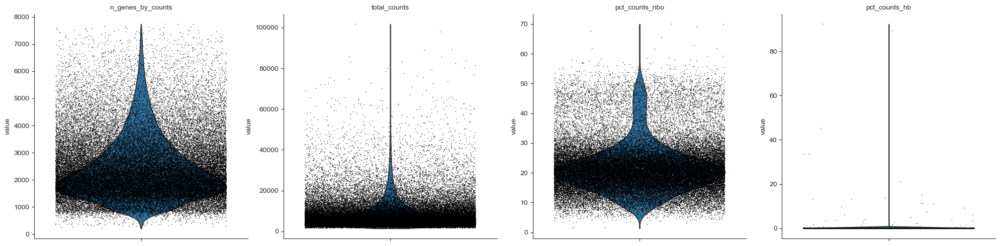

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, multi_panel=True)

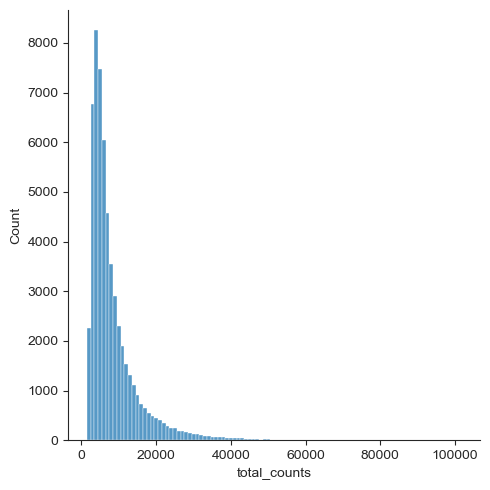

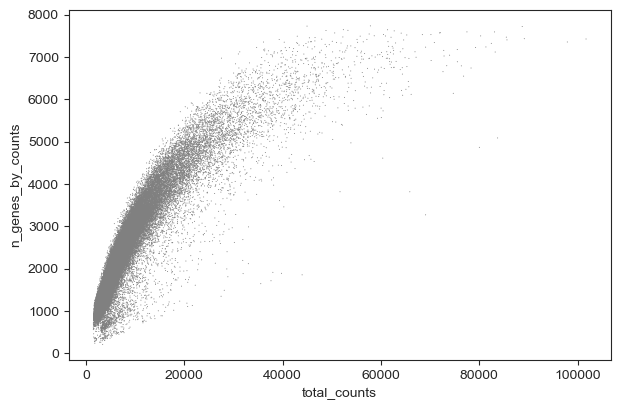

In [10]:
import seaborn as sns

p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts")

In [10]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * M.mad()) | (
        np.median(M) + nmads * M.mad() < M
    )
    return outlier

In [11]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    55775
True      1672
Name: outlier, dtype: int64

**Função extraída do 'Single-cell best practices' para identificação de células de baixa qualidade. A partir de 5 MAD (Median Absolute Deviation) as células são 'marcadas' como outliers**

In [12]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 57447
Number of cells after filtering of low quality cells: 55775


**Após a eliminação de doublets e células de baixa qualidade ficamos com um total de 55775 de 57530 células inicialmente.
A função sc.pl.highest_expr_genes plota os genes mais expressos no nosso dataset. Como podemos observar a grande maioria dos genes do plot são pouco informativos a respeito da identidade celular**

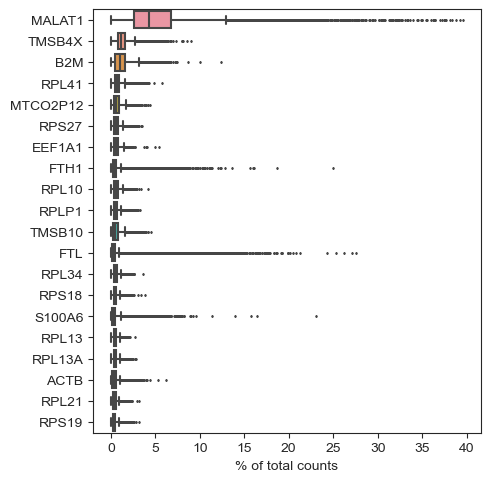

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

# Integração com scVI

In [15]:
adata.layers['counts'] = adata.X.copy()

In [16]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

**scVI usa as 'raw_counts' para construção do modelo. Para isso, criamos uma 'layer' para armazenar as counts porque, diferentemente do Seurat, Scanpy não possui múltiplas 'layers' para abrigar counts, normalized data e scale data.**

In [17]:
# Cell cycle
cell_cycle_genes = [x.strip() for x in open('D:Scanpy/cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

In [18]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

**A informação do ciclo celular é relevante e pode ajudar na separação de tipos ou estados celulares distintos. Aqui apenas calculamos o score de genes relacionados as fases S e G2M. Células que não tiveram enriquecimento para esses genes são anotadas como G1.**

In [19]:
adata.obs["cell_cycle_diff"] = adata.obs["S_score"] - adata.obs["G2M_score"]

**Tendo em vista que nem todos os genes contribuem para variância do nosso dataset, vamos encontrar os 3000 highly-variable genes e filtrar a matriz. O comando 'adata.raw = adata' usado lá em cima 'congela' o objeto preservando a matriz normalizada com todos os genes**

In [20]:
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=3000, layer='counts', subset=True, batch_key='author')

In [21]:
adata.shape

(55775, 3000)

**Construímos nosso modelo scVI indicando a 'layer' onde estão as raw_counts e definimos os pacientes como nosso batch
Os parâmetros aplicados já foram empregados em benchmarks para diferentes datasets**

In [22]:
scvi.model.SCVI.setup_anndata(adata, batch_key="Patient", layer="counts")

INFO     Using batches from adata.obs["Patient"]                                                                   


INFO:scvi.data._anndata:Using batches from adata.obs["Patient"]


INFO     No label_key inputted, assuming all cells have same label                                                 


INFO:scvi.data._anndata:No label_key inputted, assuming all cells have same label


INFO     Using data from adata.layers["counts"]                                                                    


INFO:scvi.data._anndata:Using data from adata.layers["counts"]


INFO     Successfully registered anndata object containing 55775 cells, 3000 vars, 35 batches, 1 labels, and 0     
         proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.               


INFO:scvi.data._anndata:Successfully registered anndata object containing 55775 cells, 3000 vars, 35 batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.


INFO     Please do not further modify adata until model is trained.                                                


INFO:scvi.data._anndata:Please do not further modify adata until model is trained.


In [23]:
arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)

vae = scvi.model.SCVI(adata, **arches_params)
vae.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 143/143: 100%|███████████████████████████████████████| 143/143 [1:09:05<00:00, 28.99s/it, loss=1.05e+03, v_num=1]


**Nosso modelo contém a redução de dimensionalidade, assim como a expressão normalizada para os 3000 genes usados no modelo.
Calculamos os neighbors a partir das embeddings (já com correção de batch) de cada célula originada pelo modelo scVI e, por fim, geramos o UMAP**

In [24]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
adata.layers['scvi_normalized'] = vae.get_normalized_expression(library_size = 1e4)
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

**Visualizando o resultado da integração e correção de batch**

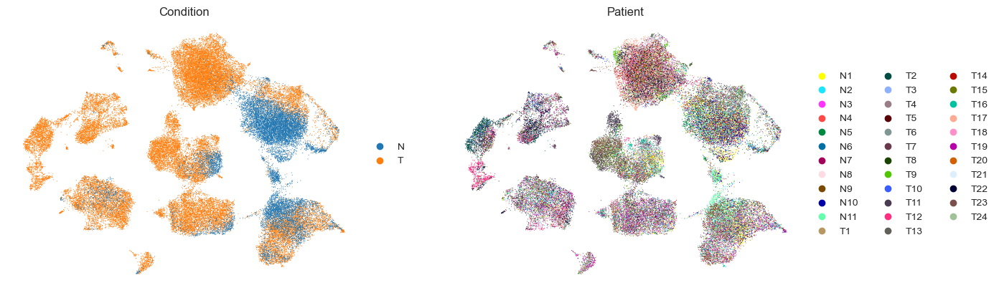

In [25]:
sc.pl.umap(adata, color = ['Condition', 'Patient'], frameon=False, ncols = 2)

**Feature plot para marcadores canônicos de células epiteliais, fibroblastos, células estreladas, células mielóides e células linfóides**

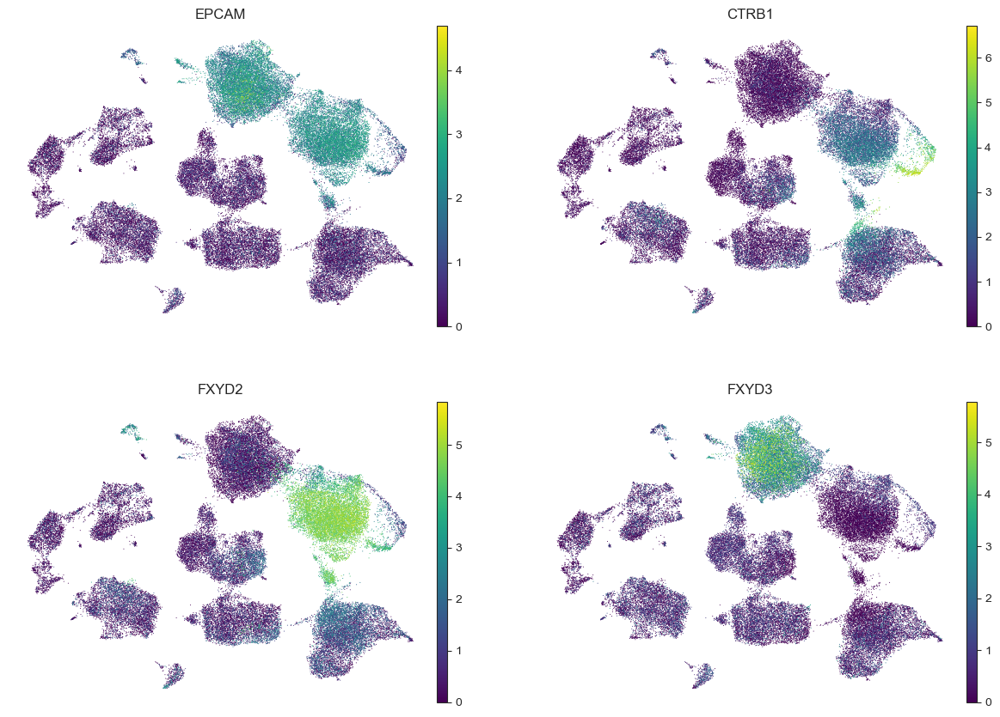

In [26]:
sc.pl.umap(adata, color = ['EPCAM', 'CTRB1', 'FXYD2', 'FXYD3'], frameon=False, ncols = 2, cmap='viridis')

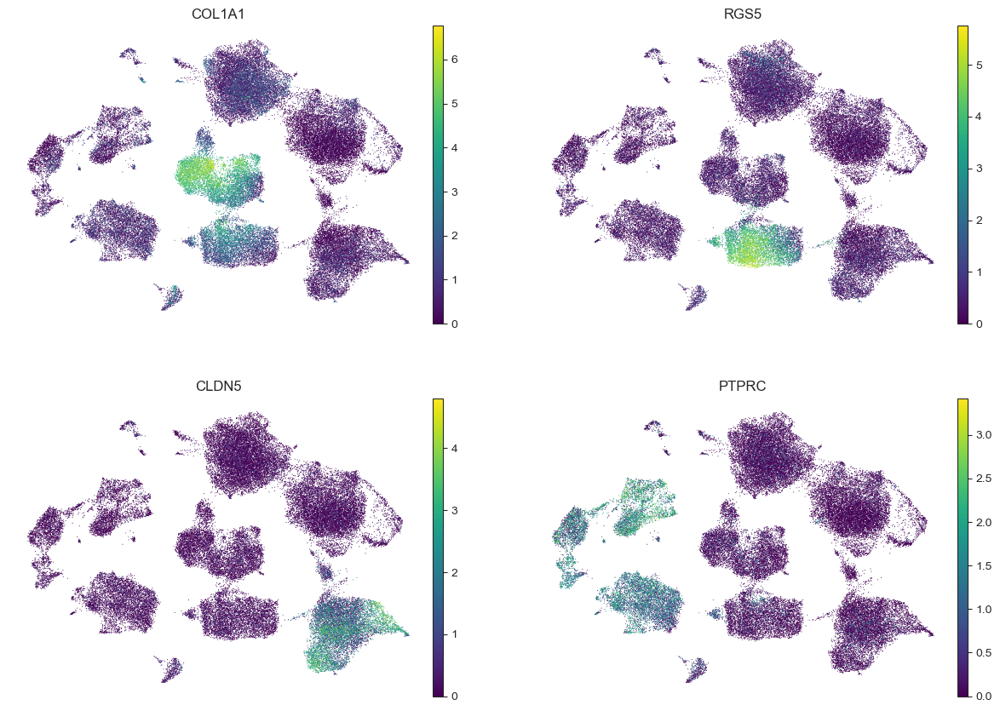

In [27]:
sc.pl.umap(adata, color = ['COL1A1', 'RGS5', 'CLDN5', 'PTPRC'], frameon=False, ncols = 2, cmap='viridis')

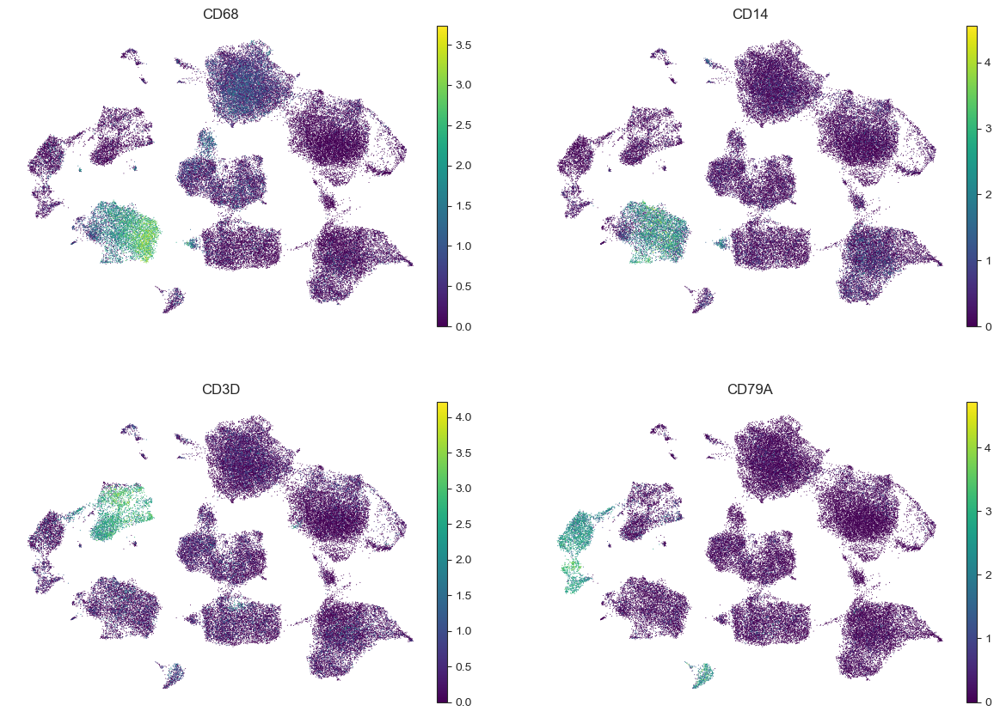

In [28]:
sc.pl.umap(adata, color = ['CD68', 'CD14', 'CD3D', 'CD79A'], frameon=False, ncols = 2, cmap='viridis')

**Por default, a resolução empregada é 1. Aqui vamos usar 3 diferentes resoluções para encontrarmos os clusters. Conforme aumentamos a resolução, mais clusters serão gerados.**

In [29]:
for resolution in [0.5, 1.0, 1.5]:
    sc.tl.leiden(adata, resolution=resolution, key_added=f"leiden_r{resolution}", random_state=0)

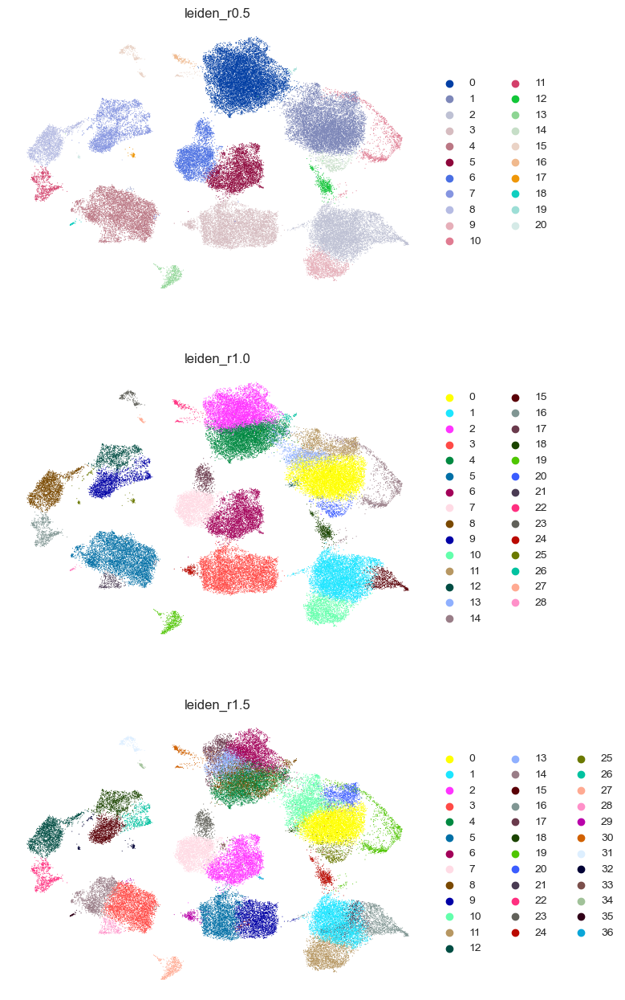

In [30]:
sc.pl.umap(adata, color=['leiden_r0.5', 'leiden_r1.0', 'leiden_r1.5'], frameon=False, ncols=1)

**A primeira linha abaixo irá calcular expressão diferencial entre os clusters para a resolução 0.5. Em seguida, filtramos os genes com expressão maior do que 0.5 e com p-valor ajustado menor do que 0.05.**

In [31]:
sc.tl.rank_genes_groups(adata, 'leiden_r0.5', method='wilcoxon')
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]

In [32]:
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,KRT19,154.946747,4.451251,0.000000,0.000000
1,0,C19orf33,154.432556,5.535117,0.000000,0.000000
2,0,S100A6,152.069687,3.162104,0.000000,0.000000
3,0,FXYD3,147.641693,4.997566,0.000000,0.000000
4,0,MUC1,141.595566,4.313207,0.000000,0.000000
...,...,...,...,...,...,...
360421,20,PACSIN1,3.256897,8.335572,0.001126,0.043999
360422,20,LCP1,3.246694,1.945137,0.001168,0.045118
360423,20,COMMD6,3.226513,0.590483,0.001253,0.047910
360424,20,ZFP36,3.225486,1.038530,0.001258,0.047980


In [36]:
sc.tl.rank_genes_groups(adata, 'leiden_r1.0', method='wilcoxon')
markers1 = sc.get.rank_genes_groups_df(adata, None)
markers1 = markers1[(markers1.pvals_adj < 0.05) & (markers1.logfoldchanges > .5)]

In [37]:
sc.tl.rank_genes_groups(adata, 'leiden_r1.5', method='wilcoxon')
markers15 = sc.get.rank_genes_groups_df(adata, None)
markers15 = markers15[(markers15.pvals_adj < 0.05) & (markers15.logfoldchanges > .5)]

In [38]:
cell_markers = {
    'B cells': ['CD79A', 'MS4A1', 'CD79B'],
    'Myeloid cells': ['CD68', 'CD14', 'AIF1'],
    'T-NK cells': ['CD3D', 'NKG7', 'FOXP3'],
    'Ductal cells': ['CFTR', 'AMBP', 'FXYD2'],
    'Acinar cells': ['CTRB1', 'AMY2A', 'CPB1'],
    'Plasma cells': ['MZB1', 'JCHAIN', 'DERL3'],
    'Fibroblasts': ['COL1A1', 'CTHRC1', 'DCN'],
    'Stellate cells': ['RGS5', 'MYH11', 'ACTA2'],
    'Endothelial cells': ['CLDN5', 'VWF', 'PLVAP'],
    'Malignant cells': ['FXYD3', 'KRT19', 'MUC1']
}

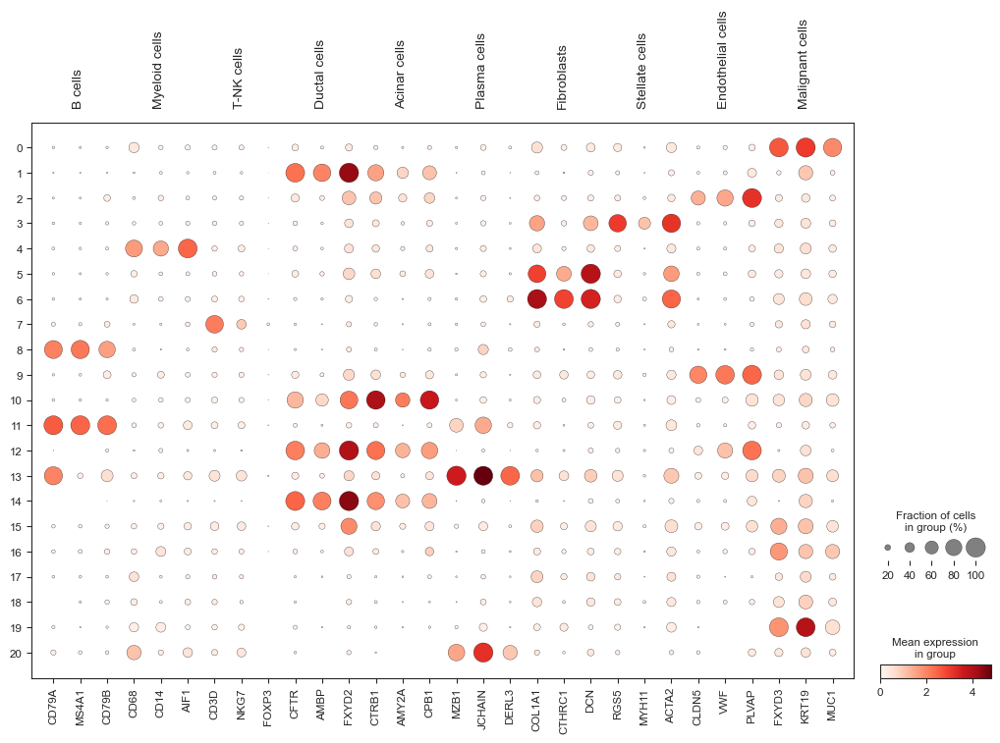

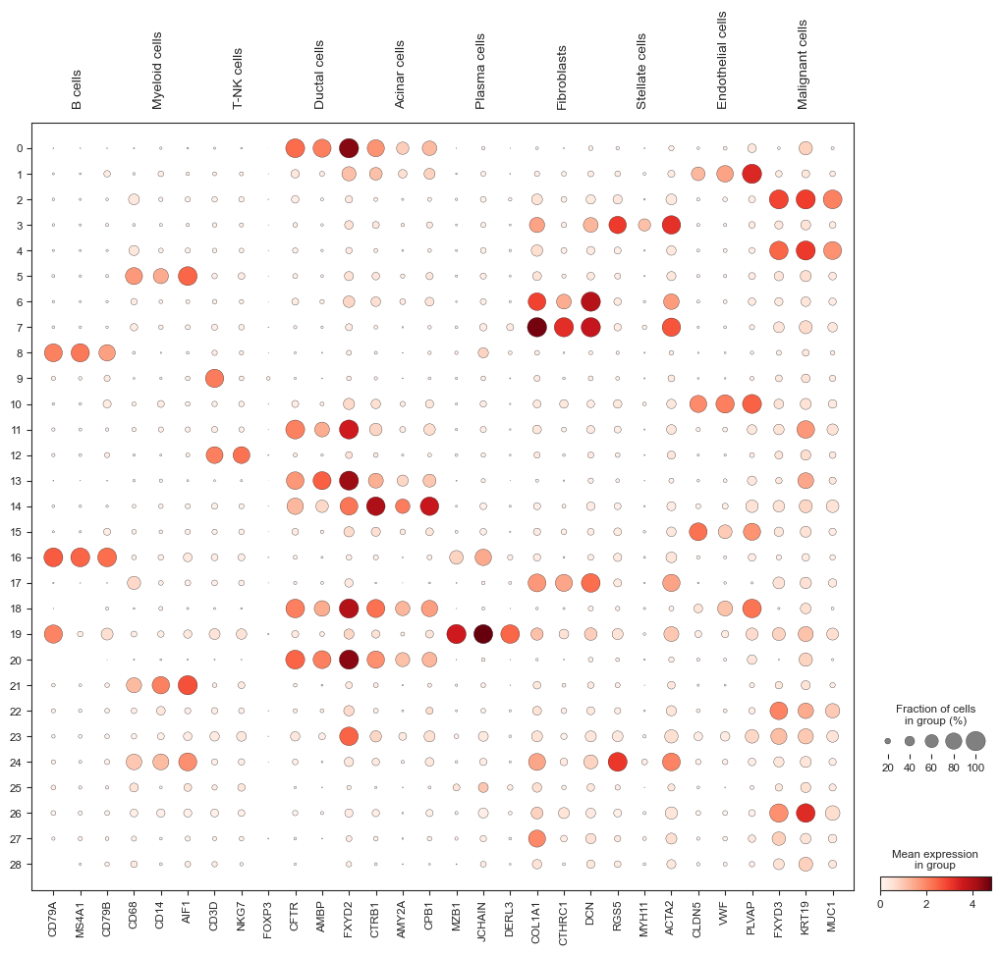

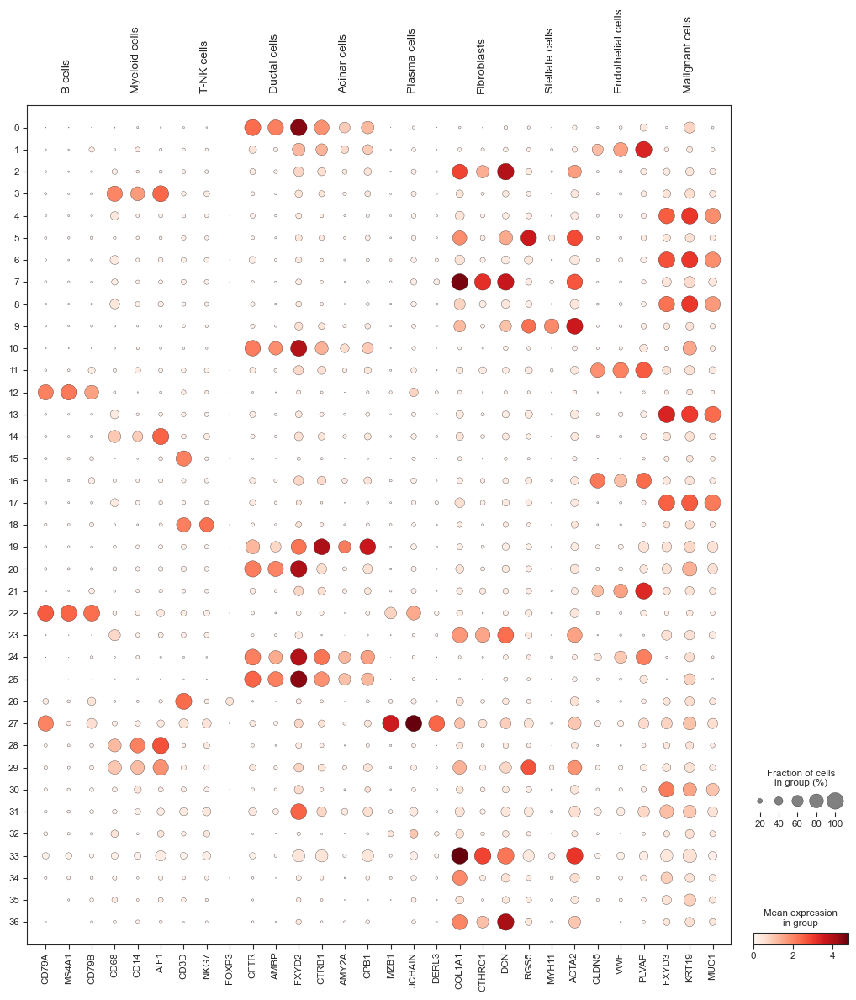

In [39]:
sc.pl.dotplot(adata, cell_markers, 'leiden_r0.5', dendrogram=False)
sc.pl.dotplot(adata, cell_markers, 'leiden_r1.0', dendrogram=False)
sc.pl.dotplot(adata, cell_markers, 'leiden_r1.5', dendrogram=False)

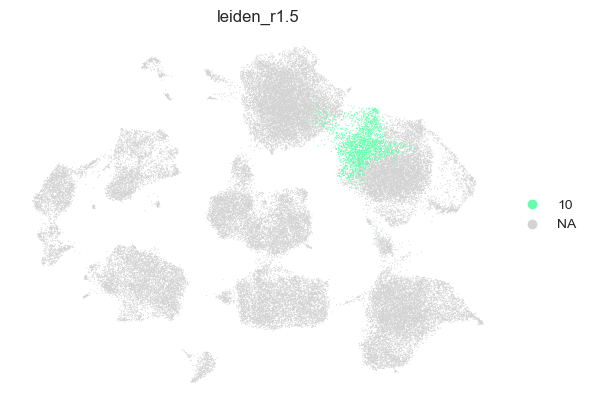

In [40]:
sc.pl.umap(adata, color = 'leiden_r1.5', frameon=False, groups=('10'))

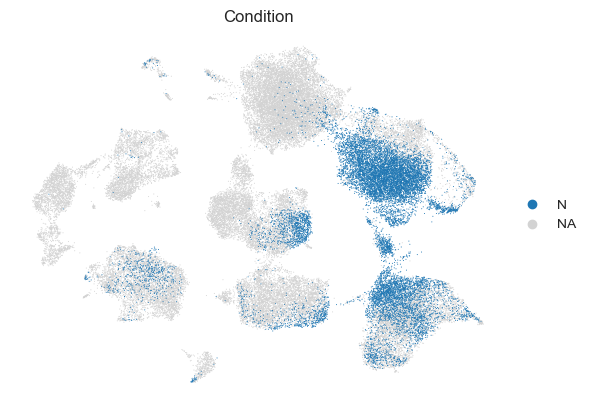

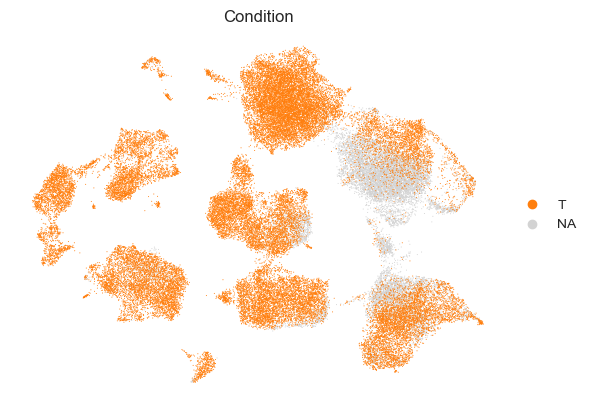

In [43]:
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('N'))
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('T'))

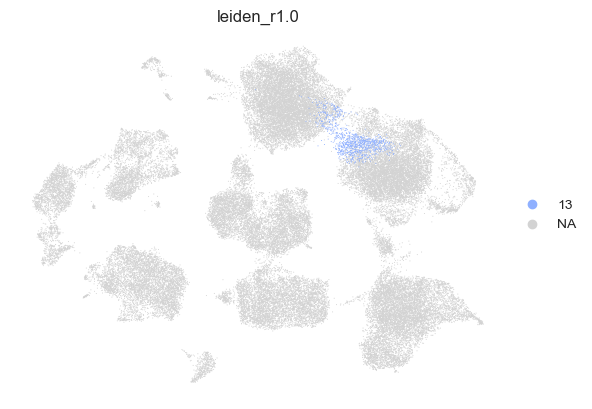

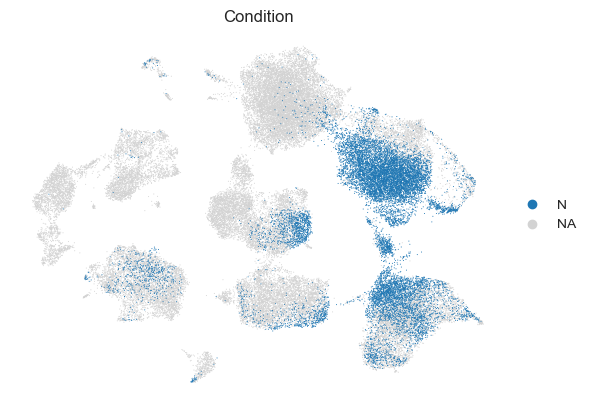

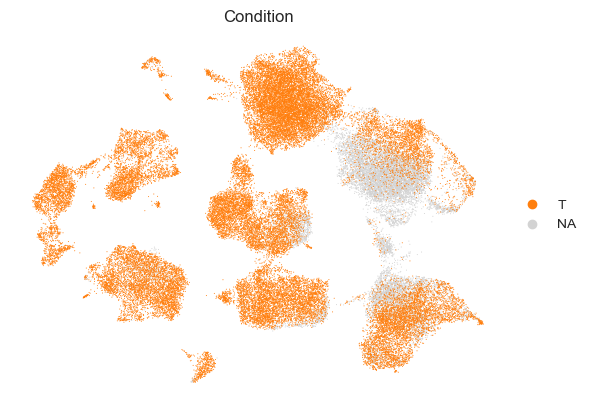

In [47]:
sc.pl.umap(adata, color = 'leiden_r1.0', frameon=False, groups=('13'))
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('N'))
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('T'))

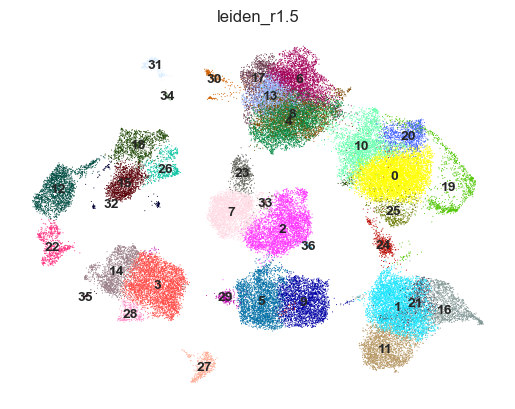

In [48]:
sc.pl.umap(adata, color = 'leiden_r1.5', frameon=False, legend_loc='on data')

In [52]:
# Dictionary para nomear os clusters

cell_labelr15 = {'0':'Ductal cells 1',
              '1':'Endothelial cells',
              '2':'Fibroblasts',
              '3':'Myeloid cells',
              '4':'Ductal cells 2',
              '5':'Stellate cells',
              '6':'Ductal cells 2',
              '7':'Fibroblasts',
              '8':'Ductal cells 2',
              '9':'Stellate cells',
              '10':'Ductal cells 1',
              '11':'Endothelial cells',
              '12':'B cells',
              '13':'Ductal cells 2',
              '14':'Myeloid cells',
              '15':'T-NK cells',
              '16':'Endothelial cells',
              '17':'Ductal cells 2',
              '18':'T-NK cells',
              '19':'Acinar cells',
              '20':'Ductal cells 1',
              '21':'Endothelial cells',
              '22':'B cells',
              '23':'Fibroblasts',
              '24':'Ductal cells 1',
              '25':'Ductal cells 1',
              '26':'T-NK cells',
              '27':'Plasma cells',
              '28':'Myeloid cells',
              '29':'Stellate cells',
              '30':'Ductal cells 2',
              '31':'Ductal cells 1',
              '32':'Plasma cells',
              '33':'Fibroblasts',
              '34':'Fibroblasts',
              '35':'Myeloid cells',
              '36':'Fibroblasts'
}

In [53]:
# Vamos mapear o nosso dictionary com a coluna com o número dos clusters

adata.obs['cell_type_r15'] = adata.obs['leiden_r1.5'].map(cell_labelr15)

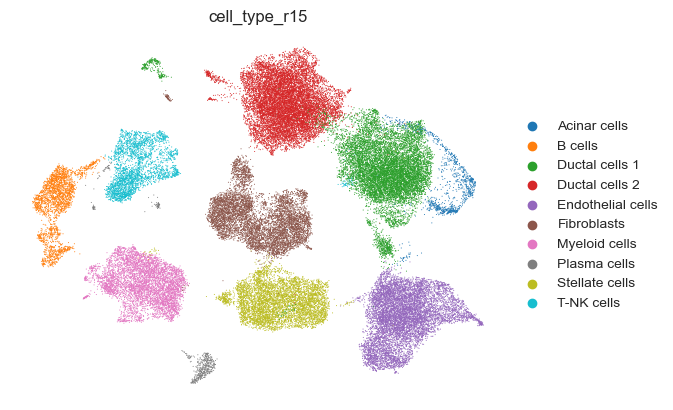

In [54]:
sc.pl.umap(adata, color = 'cell_type_r15', frameon=False)

**Vamos salvar o modelo e o objeto Anndata antes de continuarmos**

In [55]:
vae.save("D:/Scanpy/Workflow_A/scvi_Peng.model")
adata.write("D:/Scanpy/Workflow_A/adata_scvi_Peng.h5ad")

# inferCNV

**Uma hallmark dos tumores é a instabilidade genômica. Tumores frequentemente apresentam alterações no número de cópia (CNV/CNA = Copy Number Variation ou Copy Number Alteration) e isso pode ser utilizado para diferenciar células malignas de não malignas.
O plugin infercnvpy (adaptado do pacote inferCNV do R) calcula o score de CNV para cada célula. Inicialmente, precisamos de um arquivo GTF (o qual contém informações sobre a estrutura do gene --> localização cromossômica, tamanho do gene). Vamos adicionar essas informações ao 'adata.var' para cada um dos genes em comum (presentes no GTF e na nossa matriz). infercnvpy utiliza a matriz normalizada para gerar os scores e precisamos fornecer células que serão utilizadas como referência (células do microambiente por exemplo).**

In [5]:
# Aqui vamos acessar a matriz completa

adata = adata.raw.to_adata()

In [9]:
adata.var

,ENSEMBL,SYMBOL,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
LINC00115,ENSG00000225880,LINC00115,False,False,2163,0.039724,0.038955,96.234790,2282.0,7.733246
FAM41C,ENSG00000230368,FAM41C,False,False,1361,0.024701,0.024401,97.630860,1419.0,7.258412
SAMD11,ENSG00000187634,SAMD11,False,False,1777,0.042021,0.041162,96.906714,2414.0,7.789454
NOC2L,ENSG00000188976,NOC2L,False,False,15229,0.357477,0.305628,73.490348,20536.0,9.929983
KLHL17,ENSG00000187961,KLHL17,False,False,1102,0.019705,0.019513,98.081710,1132.0,7.032624
...,...,...,...,...,...,...,...,...,...,...
NAV2-AS2,ENSG00000254453,NAV2-AS2,False,False,6,0.000104,0.000104,99.989556,6.0,1.945910
MIR3179-1,ENSG00000284305,MIR3179-1,False,False,3,0.000052,0.000052,99.994778,3.0,1.386294
ZNF32-AS1,ENSG00000226245,ZNF32-AS1,False,False,1,0.000017,0.000017,99.998259,1.0,0.693147
RXYLT1-AS1,ENSG00000255850,RXYLT1-AS1,False,False,3,0.000052,0.000052,99.994778,3.0,1.386294


In [11]:
import infercnvpy as cnv

cnv.io.genomic_position_from_gtf("D:Scanpy/hg38/Homo_sapiens.GRCh38.107.gtf", adata=adata, gtf_gene_id='gene_name', inplace=True)
adata.var['chromosome'] = ['chr'+str(i) for i in adata.var['chromosome']]
adata.var['chromosome'].value_counts()

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_name']


chr1      1831
chr19     1272
chr2      1181
chr17     1045
chr3      1034
chr11     1014
chr6       958
chr12      952
chr5       823
chr7       810
chr16      775
chr10      708
chr4       681
chr9       675
chrX       649
chr8       608
chr14      566
chr15      540
chr20      490
chr22      410
chr13      339
chr18      252
chrnan     196
chr21      183
chrY        16
Name: chromosome, dtype: int64

In [12]:
adata.var

,ENSEMBL,SYMBOL,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,chromosome,start,end,gene_id,gene_name
LINC00115,ENSG00000225880,LINC00115,False,False,2163,0.039724,0.038955,96.234790,2282.0,7.733246,chr1,824228.0,827539.0,ENSG00000225880,LINC00115
FAM41C,ENSG00000230368,FAM41C,False,False,1361,0.024701,0.024401,97.630860,1419.0,7.258412,chr1,868071.0,876903.0,ENSG00000230368,FAM41C
SAMD11,ENSG00000187634,SAMD11,False,False,1777,0.042021,0.041162,96.906714,2414.0,7.789454,chr1,923923.0,944575.0,ENSG00000187634,SAMD11
NOC2L,ENSG00000188976,NOC2L,False,False,15229,0.357477,0.305628,73.490348,20536.0,9.929983,chr1,944203.0,959309.0,ENSG00000188976,NOC2L
KLHL17,ENSG00000187961,KLHL17,False,False,1102,0.019705,0.019513,98.081710,1132.0,7.032624,chr1,960584.0,965719.0,ENSG00000187961,KLHL17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NAV2-AS2,ENSG00000254453,NAV2-AS2,False,False,6,0.000104,0.000104,99.989556,6.0,1.945910,chr11,20043767.0,20049458.0,ENSG00000254453,NAV2-AS2
MIR3179-1,ENSG00000284305,MIR3179-1,False,False,3,0.000052,0.000052,99.994778,3.0,1.386294,chr16,14901508.0,14901591.0,ENSG00000284305,MIR3179-1
ZNF32-AS1,ENSG00000226245,ZNF32-AS1,False,False,1,0.000017,0.000017,99.998259,1.0,0.693147,chr10,43643872.0,43645047.0,ENSG00000226245,ZNF32-AS1
RXYLT1-AS1,ENSG00000255850,RXYLT1-AS1,False,False,3,0.000052,0.000052,99.994778,3.0,1.386294,chr12,63804739.0,63822156.0,ENSG00000255850,RXYLT1-AS1


In [13]:
cnv.tl.infercnv(
    adata,
    reference_key="cell_type_r15",
    reference_cat=["Stellate cells",'B cells', 'Myeloid cells', 'T-NK cells', 'Fibroblasts', 'Endothelial cells', 'Plasma cells'],
    window_size=250)

  0%|          | 0/12 [00:00<?, ?it/s]

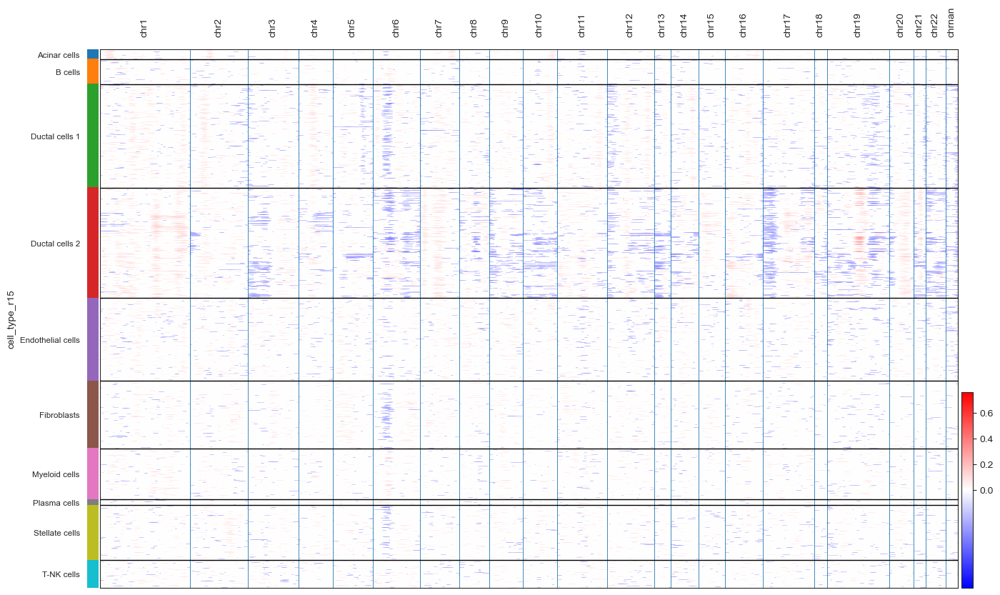

In [14]:
cnv.pl.chromosome_heatmap(adata, groupby="cell_type_r15")

In [15]:
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)
cnv.tl.leiden(adata)

In [16]:
cnv.tl.cnv_score(adata)

... storing 'chromosome' as categorical
... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


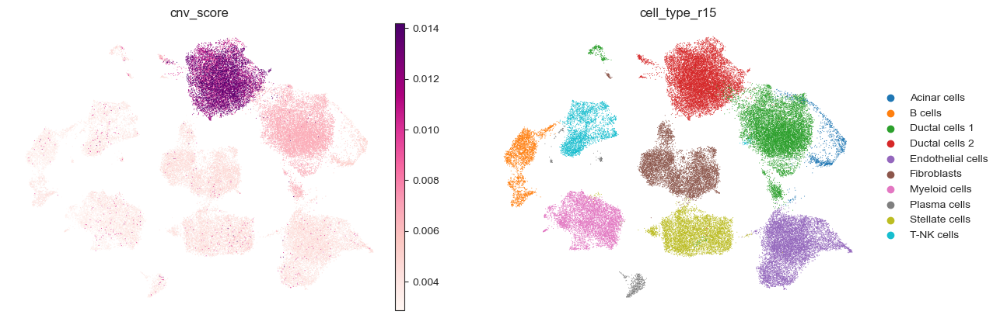

In [17]:
sc.pl.umap(adata, color=['cnv_score', 'cell_type_r15'], ncols=2, frameon=False, cmap='RdPu')

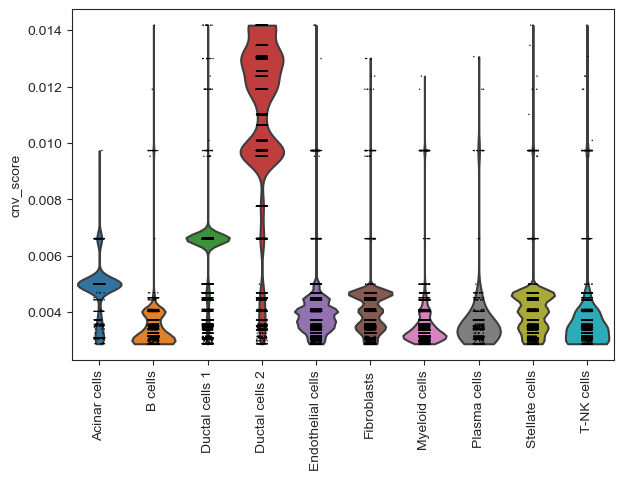

In [18]:
sc.pl.violin(adata,'cnv_score',  groupby= 'cell_type_r15', rotation=90)

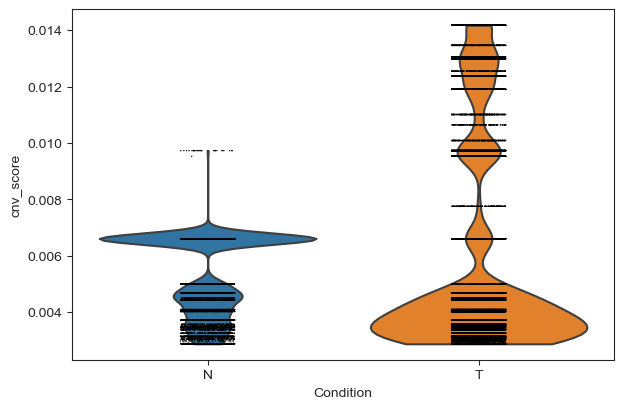

In [19]:
sc.pl.violin(adata,'cnv_score',  groupby= 'Condition')

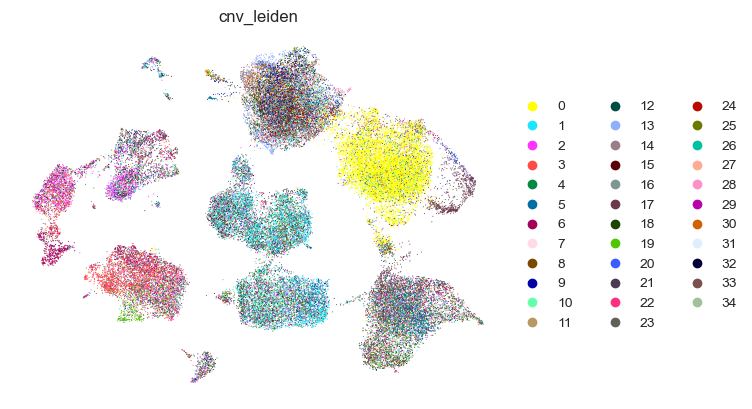

In [21]:
sc.pl.umap(adata, color = 'cnv_leiden', frameon=False)

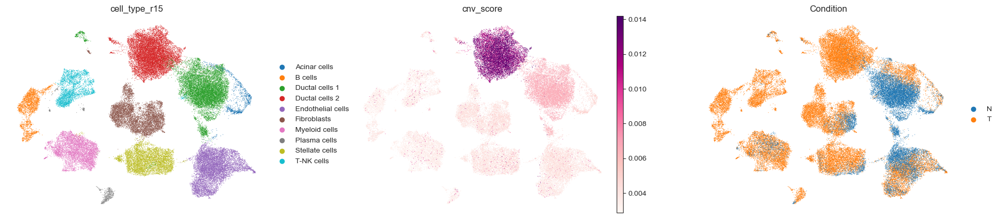

In [22]:
sc.pl.umap(adata, color = ['cell_type_r15', 'cnv_score', 'Condition'], frameon=False, ncols = 3, cmap = 'RdPu', wspace=0.2)

In [26]:
adata.write("D:/Scanpy/Workflow_A/adata_cnv_Peng.h5ad")

# Integração com Harmony

**O pipeline com Harmony é muito semelhante com o pipeline do Seurat. Nosso ponto de partida é após a normalização porque já removemos doublets, células de baixa qualidade e normalizamos (todos esses passos são comuns para integração com scVI ou Harmony).**

In [13]:
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [14]:
# Cell cycle
cell_cycle_genes = [x.strip() for x in open('D:Scanpy/cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata.obs["cell_cycle_diff"] = adata.obs["S_score"] - adata.obs["G2M_score"]

In [15]:
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=3000)
adata = adata[:,adata.var.highly_variable]

**Como scVI utiliza um modelo que faz redução de dimensionalidade e correção na matriz, o scaling não era preciso. Entretanto, Harmony só faz uma correção nas embeddings do PCA sendo necessário seguir o standard workflow do Scanpy até remoção do efeito de batch.**

In [16]:
sc.pp.scale(adata, max_value=10)

**Redução de dimensionalidade com PCA. A função 'sc.tl.pca' reduz, por default, nossa matriz com 3000 HVGs em 50 PCs. Os primeiros PCs contribuem com a maior variancia do dataset, enquanto os últimos carecem de informações relevantes. Uma forma para avaliar o número de PCs para utilizar nos passos downstream é o 'ElbowPlot'. Quando a curva começa a ficar mais 'reta', ou seja, estamos perdendo menos variância (eixo Y). Na figura abaixo, podemos observar que após 35 PCs a diferença fica muito pequena. Sendo assim, um número ideal para esse exemplo fica entre 35-40 PCs.

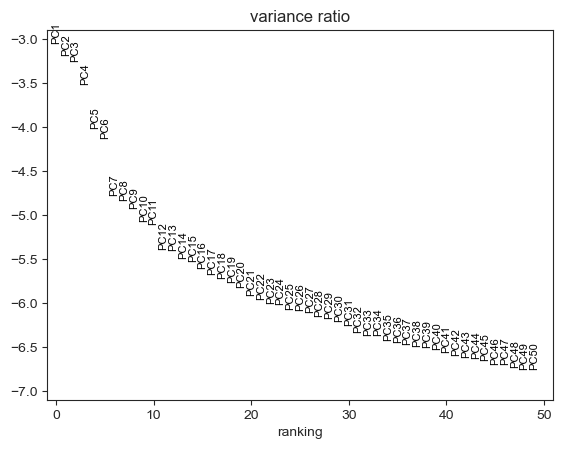

In [17]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

**Harmony aplica uma correção nas embeddings em um espaço de baixa dimensão (PCA). O próprio argumento da função abaixo é o nosso objeto Anndata seguido do 'batch' que são os pacientes. Múltiplas regressões lineares são feitas até chegar na convergência (remoção do efeito de batch)**

In [18]:
sce.pp.harmony_integrate(adata, 'Patient')

2023-04-02 00:27:26,875 - harmonypy - INFO - Iteration 1 of 10
2023-04-02 00:27:47,951 - harmonypy - INFO - Iteration 2 of 10
2023-04-02 00:28:08,004 - harmonypy - INFO - Iteration 3 of 10
2023-04-02 00:28:28,094 - harmonypy - INFO - Iteration 4 of 10
2023-04-02 00:28:47,788 - harmonypy - INFO - Iteration 5 of 10
2023-04-02 00:28:59,188 - harmonypy - INFO - Converged after 5 iterations


**Semelhante ao que acontece com scVI, Harmony gera uma matriz com as embeddings corrigidas. No argumento, 'use_rep' estamos indicando que vamos calcular os neighbors na matriz corrigida pelo Harmony**

In [19]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony', n_pcs=35)

In [20]:
sc.tl.umap(adata)

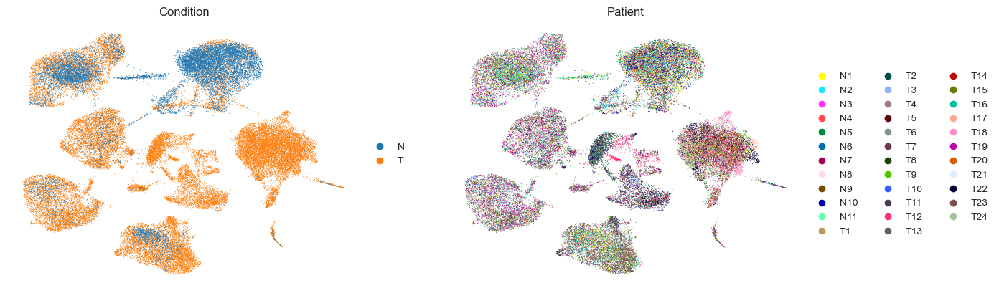

In [21]:
sc.pl.umap(adata, color = ['Condition', 'Patient'], frameon=False, ncols = 2)

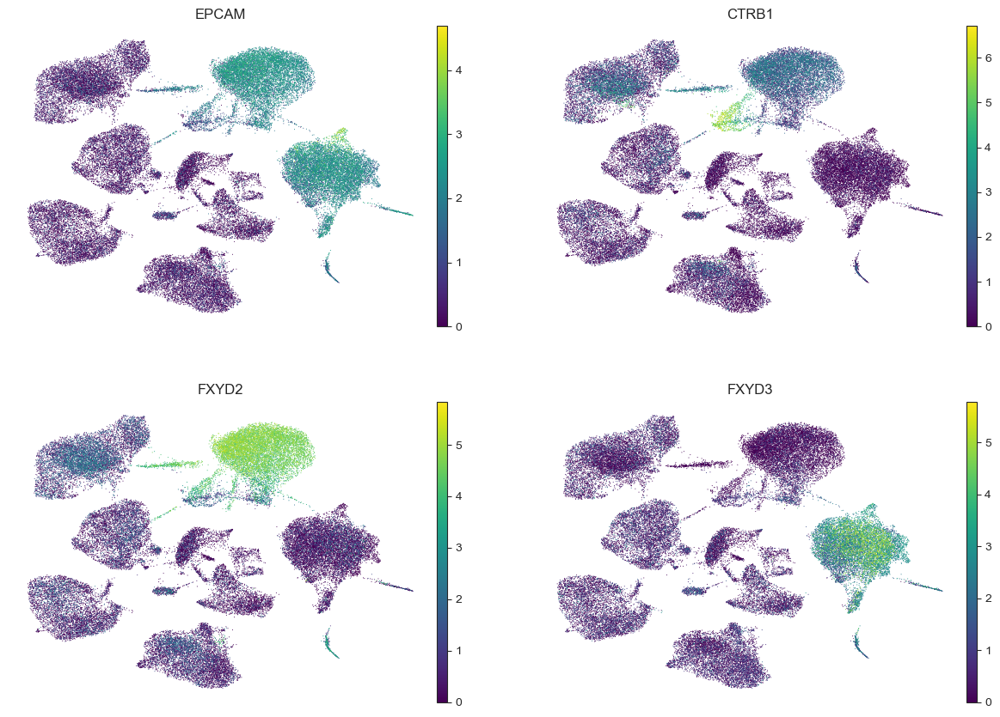

In [22]:
sc.pl.umap(adata, color = ['EPCAM', 'CTRB1', 'FXYD2', 'FXYD3'], frameon=False, ncols = 2, cmap='viridis')

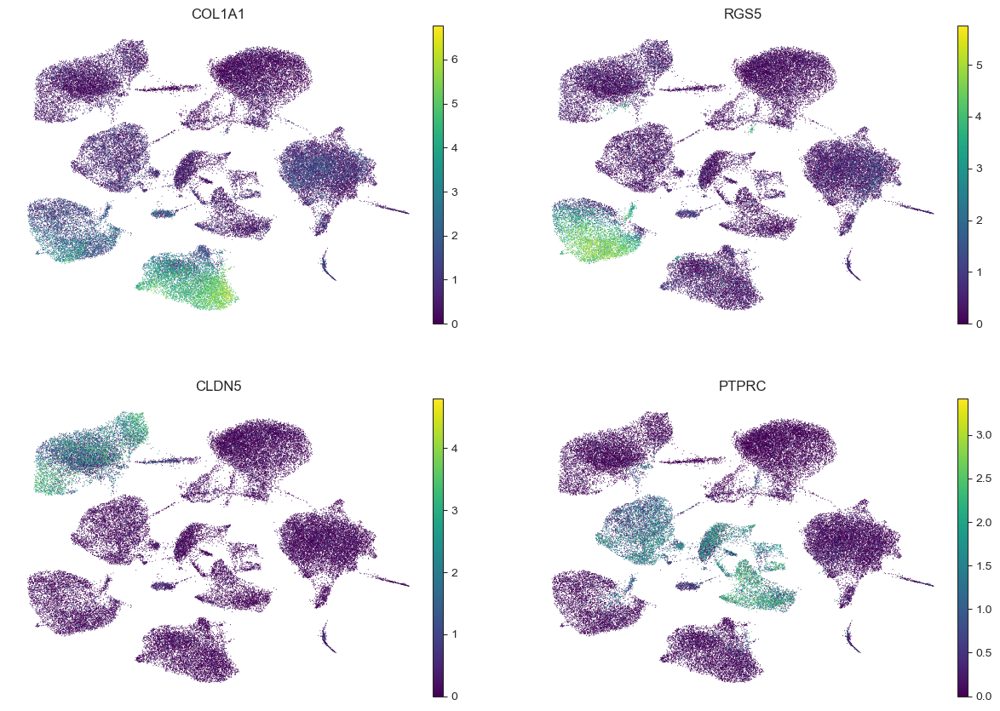

In [23]:
sc.pl.umap(adata, color = ['COL1A1', 'RGS5', 'CLDN5', 'PTPRC'], frameon=False, ncols = 2, cmap='viridis')

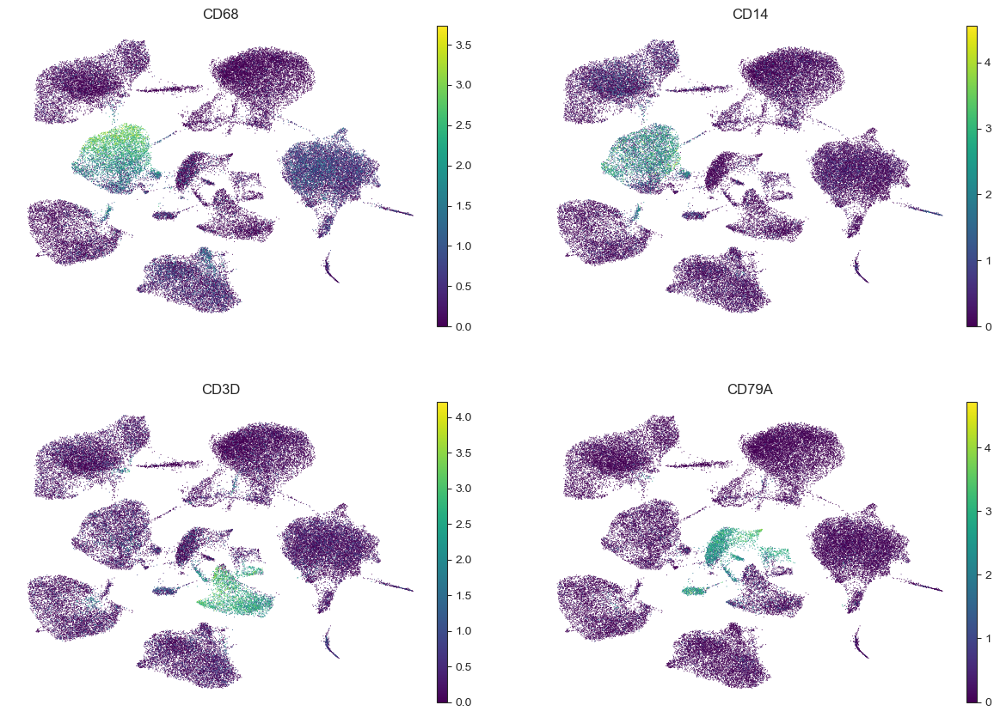

In [24]:
sc.pl.umap(adata, color = ['CD68', 'CD14', 'CD3D', 'CD79A'], frameon=False, ncols = 2, cmap='viridis')

In [25]:
for resolution in [0.5, 1.0, 1.5]:
    sc.tl.leiden(adata, resolution=resolution, key_added=f"leiden_r{resolution}", random_state=0)

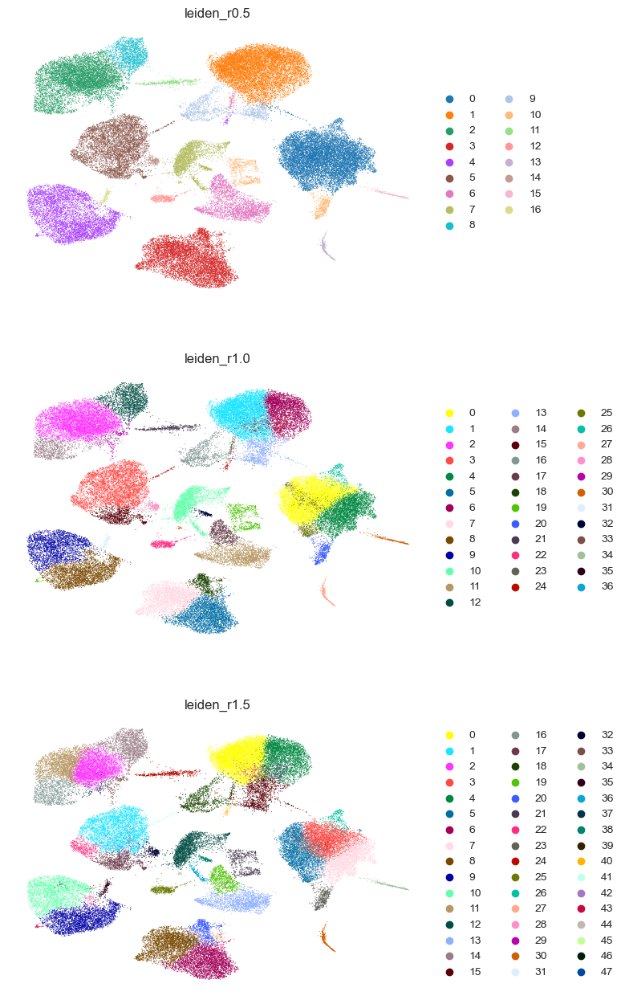

In [26]:
sc.pl.umap(adata, color=['leiden_r0.5', 'leiden_r1.0', 'leiden_r1.5'], frameon=False, ncols=1)

In [27]:
sc.tl.rank_genes_groups(adata, 'leiden_r0.5', method='wilcoxon')
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]

sc.tl.rank_genes_groups(adata, 'leiden_r1.0', method='wilcoxon')
markers1 = sc.get.rank_genes_groups_df(adata, None)
markers1 = markers1[(markers1.pvals_adj < 0.05) & (markers1.logfoldchanges > .5)]

sc.tl.rank_genes_groups(adata, 'leiden_r1.5', method='wilcoxon')
markers15 = sc.get.rank_genes_groups_df(adata, None)
markers15 = markers15[(markers15.pvals_adj < 0.05) & (markers15.logfoldchanges > .5)]

In [28]:
cell_markers = {
    'B cells': ['CD79A', 'MS4A1', 'CD79B'],
    'Myeloid cells': ['CD68', 'CD14', 'AIF1'],
    'T-NK cells': ['CD3D', 'NKG7', 'FOXP3'],
    'Ductal cells': ['CFTR', 'AMBP', 'FXYD2'],
    'Acinar cells': ['CTRB1', 'AMY2A', 'CPB1'],
    'Plasma cells': ['MZB1', 'JCHAIN', 'DERL3'],
    'Fibroblasts': ['COL1A1', 'CTHRC1', 'DCN'],
    'Stellate cells': ['RGS5', 'MYH11', 'ACTA2'],
    'Endothelial cells': ['CLDN5', 'VWF', 'PLVAP'],
    'Malignant cells': ['FXYD3', 'KRT19', 'MUC1']
}

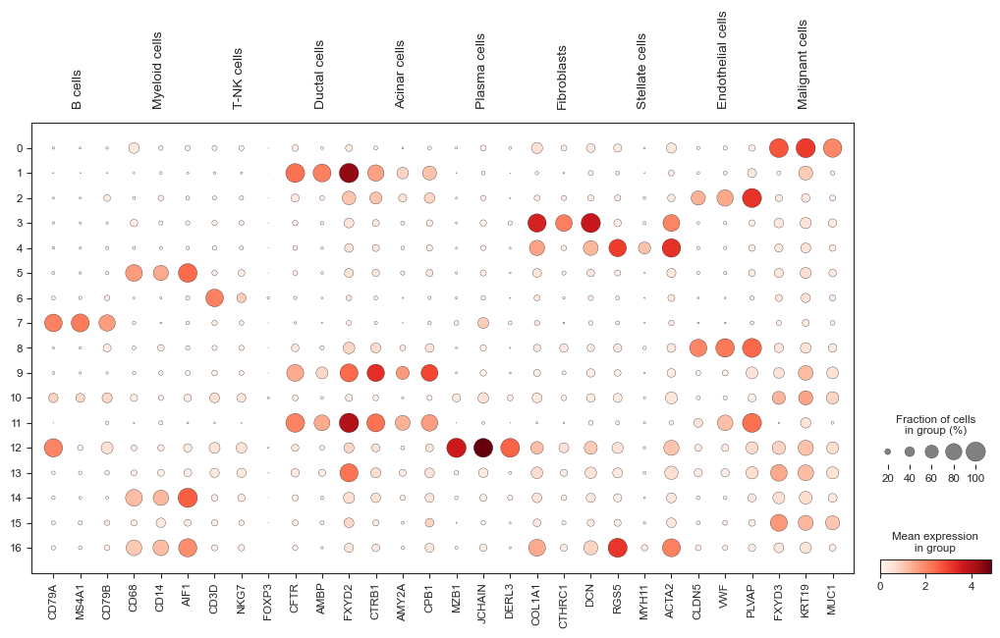

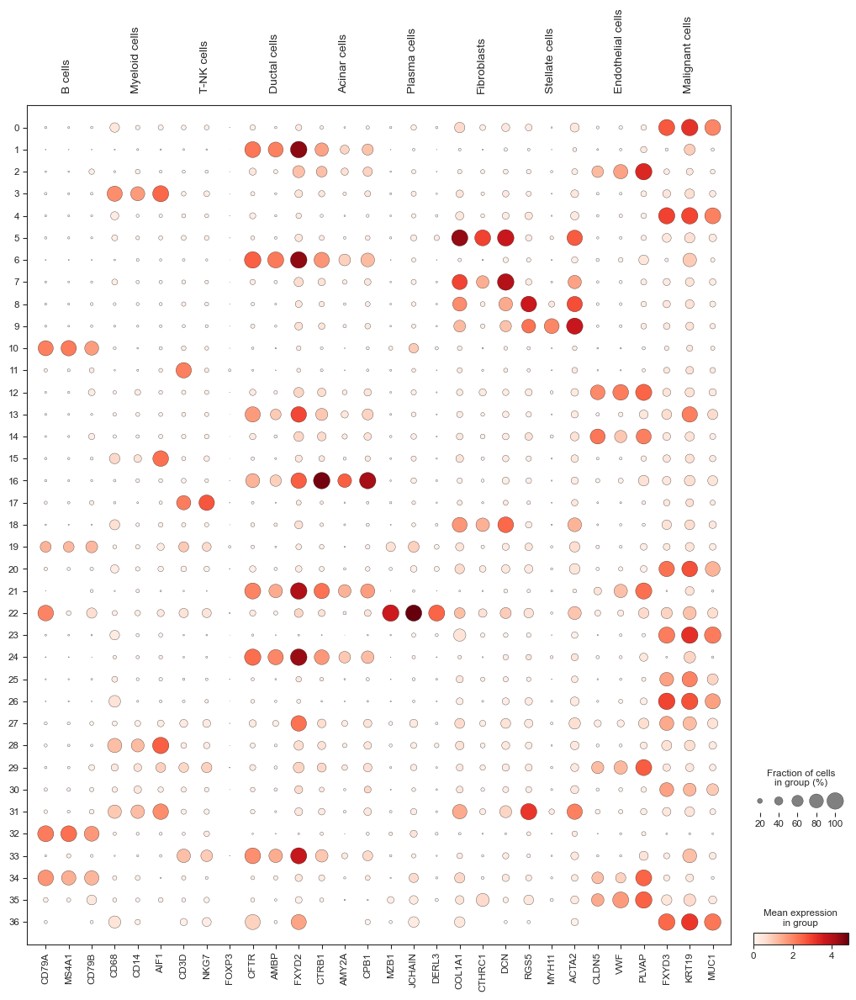

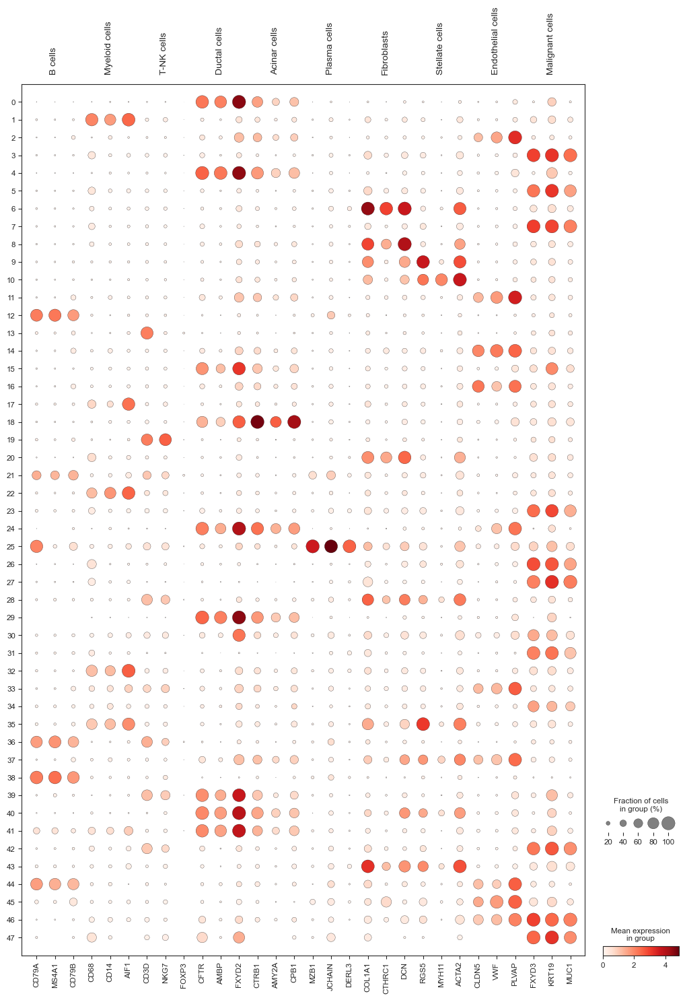

In [29]:
sc.pl.dotplot(adata, cell_markers, 'leiden_r0.5', dendrogram=False)
sc.pl.dotplot(adata, cell_markers, 'leiden_r1.0', dendrogram=False)
sc.pl.dotplot(adata, cell_markers, 'leiden_r1.5', dendrogram=False)

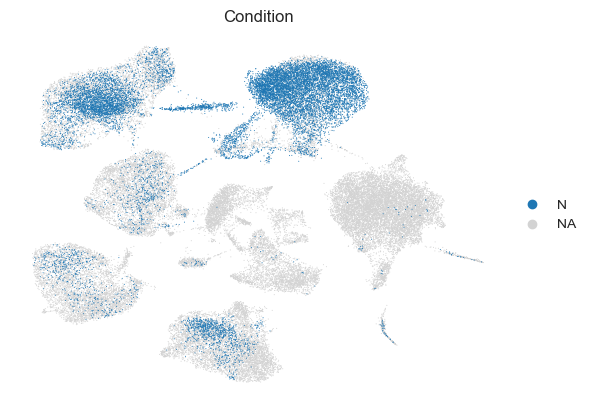

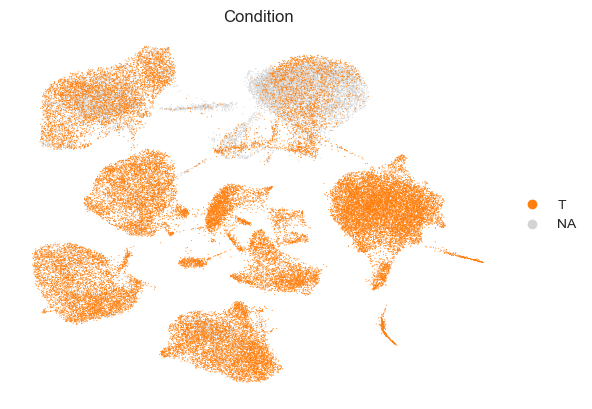

In [30]:
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('N'))
sc.pl.umap(adata, color = 'Condition', frameon=False, groups=('T'))

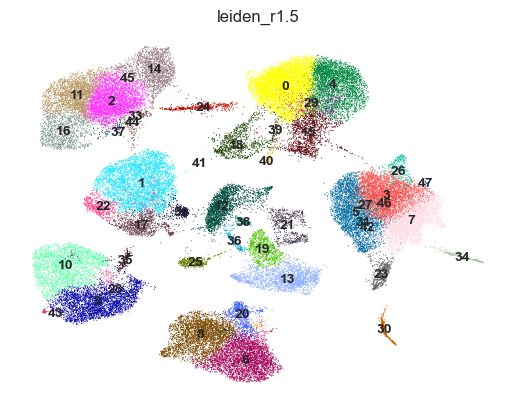

In [33]:
sc.pl.umap(adata, color = 'leiden_r1.5', frameon=False, legend_loc='on data')

In [34]:
markers15[markers15.group == '30'].head(15)

,group,names,scores,logfoldchanges,pvals,pvals_adj
540240,30,PCSK1N,27.833883,7.896543,1.688105e-170,3.039940e-166
540241,30,SCG5,27.078516,6.704874,1.763480e-161,1.587838e-157
540242,30,TTR,25.685369,6.576839,1.703206e-145,1.022378e-141
540243,30,CHGA,25.436430,8.330649,9.976022e-143,4.491205e-139
540244,30,SCGN,25.254124,6.237661,1.020381e-140,3.675004e-137
540245,30,CPE,24.713820,3.603868,7.597084e-135,1.954404e-131
540246,30,NEUROD1,24.690712,9.397407,1.345681e-134,3.029127e-131
540247,30,SCG3,24.353153,8.783625,5.368077e-131,1.074093e-127
540248,30,CHGB,23.556503,7.462171,1.076773e-122,1.939054e-119
540249,30,GNAS,23.259089,2.652909,1.151090e-119,1.884440e-116


In [38]:
# Dictionary para nomear os clusters

cell_labelr15 = {'0':'Ductal cells 1',
              '1':'Myeloid cells',
              '2':'Endothelial cells',
              '3':'Ductal cells 2',
              '4':'Ductal cells 1',
              '5':'Ductal cells 2',
              '6':'Fibroblasts',
              '7':'Ductal cells 2',
              '8':'Fibroblasts',
              '9':'Stellate cells',
              '10':'Stellate cells',
              '11':'Endothelial cells',
              '12':'B cells',
              '13':'T-NK cells',
              '14':'Endothelial cells',
              '15':'Ductal cells 1',
              '16':'Endothelial cells',
              '17':'Myeloid cells',
              '18':'Acinar cells',
              '19':'T-NK cells',
              '20':'Fibroblasts',
              '21':'Mixed lymphoid cells',
              '22':'Myeloid cells',
              '23':'Ductal cells 2',
              '24':'Ductal cells 1',
              '25':'Plasma cells',
              '26':'Ductal cells 2',
              '27':'Ductal cells 2',
              '28':'Stellate cells',
              '29':'Ductal cells 1',
              '30':'Endocrine cells',
              '31':'Ductal cells 2',
              '32':'Myeloid cells',
              '33':'Endothelial cells',
              '34':'Ductal cells 2',
              '35':'Stellate cells',
              '36':'B cells',
              '37':'Endothelial cells',
              '38':'B cells',
              '39':'Ductal cells 1',
              '40':'Ductal cells 1',
              '41':'Ductal cells 1',
              '42':'Ductal cells 2',
              '43':'Stellate cells',
              '44':'Endothelial cells',
              '45':'Endothelial cells',
              '46':'Ductal cells 2',
              '47':'Ductal cells 2'
}

In [39]:
adata.obs['harmony_cell_type_r15'] = adata.obs['leiden_r1.5'].map(cell_labelr15)

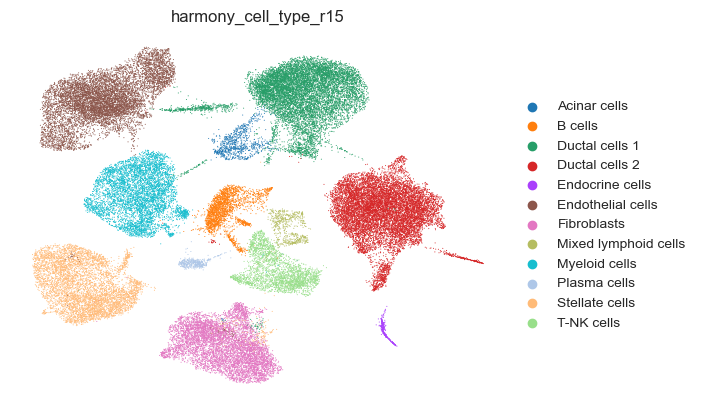

In [40]:
sc.pl.umap(adata, color = 'harmony_cell_type_r15', frameon=False)

In [41]:
adata.write("D:/Scanpy/Workflow_A/adata_harmony_Peng.h5ad")

**inferCNV**

In [3]:
adata = adata.raw.to_adata()

In [4]:
adata.shape

(55775, 18008)

In [6]:
import infercnvpy as cnv

cnv.io.genomic_position_from_gtf("D:Scanpy/hg38/Homo_sapiens.GRCh38.107.gtf", adata=adata, gtf_gene_id='gene_name', inplace=True)
adata.var['chromosome'] = ['chr'+str(i) for i in adata.var['chromosome']]
adata.var['chromosome'].value_counts()

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_name']


chr1      1831
chr19     1272
chr2      1181
chr17     1045
chr3      1034
chr11     1014
chr6       958
chr12      952
chr5       823
chr7       810
chr16      775
chr10      708
chr4       681
chr9       675
chrX       649
chr8       608
chr14      566
chr15      540
chr20      490
chr22      410
chr13      339
chr18      252
chrnan     196
chr21      183
chrY        16
Name: chromosome, dtype: int64

In [7]:
cnv.tl.infercnv(
    adata,
    reference_key="harmony_cell_type_r15",
    reference_cat=["Stellate cells",'B cells', 'Myeloid cells', 'T-NK cells', 'Fibroblasts', 'Endothelial cells', 'Plasma cells'],
    window_size=250)

  0%|          | 0/12 [00:00<?, ?it/s]

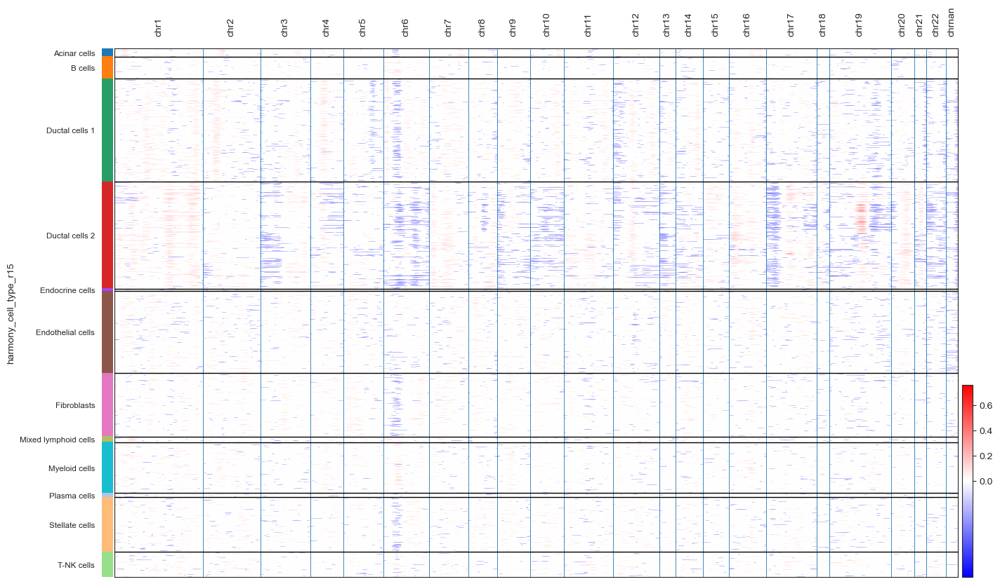

In [8]:
cnv.pl.chromosome_heatmap(adata, groupby="harmony_cell_type_r15")

In [9]:
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)
cnv.tl.leiden(adata)
cnv.tl.cnv_score(adata)

... storing 'chromosome' as categorical
... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


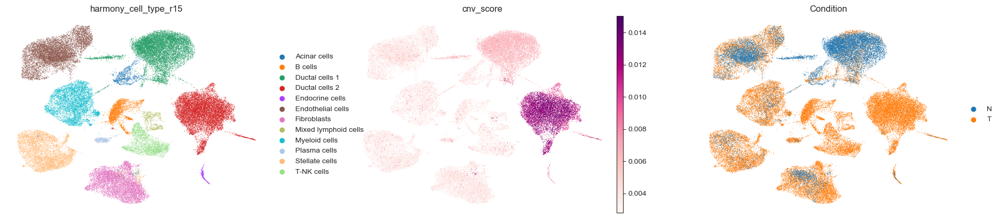

In [10]:
sc.pl.umap(adata, color=['harmony_cell_type_r15', 'cnv_score', 'Condition'], ncols=3, frameon=False, cmap='RdPu', wspace=0.2)

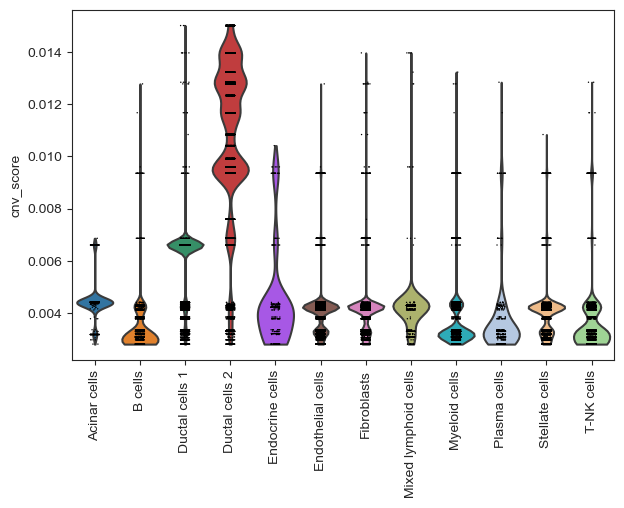

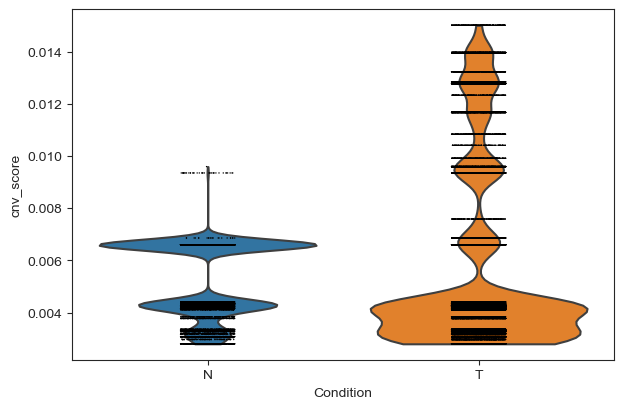

In [11]:
sc.pl.violin(adata,'cnv_score',  groupby= 'harmony_cell_type_r15', rotation=90)
sc.pl.violin(adata,'cnv_score',  groupby= 'Condition')